### Demo 5 Using CAST to align Visium Samples

In [1]:
import scanpy as sc
import torch, os
import numpy as np
import matplotlib.pyplot as plt
from os.path import join as pj
import warnings
warnings.filterwarnings("ignore")

from CAST import *
work_dir = '/home/unix/panj/wanglab/jessica/CAST/demo' #### input the demo path

#### CAST has wide utility across spatial technologies 

This demo highlights this by demonstrating CAST Mark and CAST Stack aligning two Visium mouse brain coronal sections. Notably, CAST is able to automatically search and match tissue anatomy in these samples without major changes from the user. This workflow is very similar to that in demos 4, 6 and 7 where CAST Mark and Stack are applied to a variety of samples. 

Here is an overview of the workflow: 
- Load each dataset (from h5ad files)
- Combine the datasets and filter for HVGs
- Extract the coordinate and expression data 
- Run CAST Mark 
- Run CAST Stack
- Visualize the aligned samples

CAST Mark and CAST Stack produce all of the outputs described in demo 6. For more information about the parameters of CAST Mark and CAST Stack, see demos 1 and 2 respectively. 

In [2]:
## Reading input Visium data and setting up the output directory

# Reading in two replicates of Visium data
sdata_Visium1 = sc.read_h5ad(f"{work_dir}/demo5_Visium/data/CytAssist_FFPE_Mouse_Brain_Rep1.h5ad")
sdata_Visium1.obs.rename(columns={'pxl_row_in_fullres':'column','pxl_col_in_fullres':'row'},inplace=True)
sdata_Visium2 = sc.read_h5ad(f"{work_dir}/demo5_Visium/data/CytAssist_FFPE_Mouse_Brain_Rep2.h5ad")
sdata_Visium2.obs.rename(columns={'pxl_row_in_fullres':'column','pxl_col_in_fullres':'row'},inplace=True)

# output directory for the STARmap_vs_SlideSeq demo
output_path = pj(work_dir, "demo5_Visium/demo_output/Visium_vs_Visium") # set output_path
os.makedirs(output_path,exist_ok=True)

In [3]:
## Make gene names unique by adding freuqency counts to duplicates

def make_unique(s):
    if s in counts:
        counts[s] += 1
    else:
        counts[s] = 0
    return s if counts[s] == 0 else f"{s}_{counts[s]}"

counts = {}
sdata_Visium1.var.index = sdata_Visium1.var.index.map(make_unique)
counts = {}
sdata_Visium2.var.index = sdata_Visium2.var.index.map(make_unique)

In [4]:
## Combine the two Visium datasets

# combine the two datasets
sample_list= ['Visium1','Visium2'] # [Query, Reference]
sdata = sdata_Visium1.concatenate(sdata_Visium2)

# rename the dataset labels to Visium1 and Visium2
batch_key = 'batch'
batch_rename = {'0' : sample_list[0],'1' : sample_list[1]}
sdata.obs.replace({batch_key:batch_rename},inplace=True)

# Filter for highly variable genes
sdata.var['highly_variable'] = detect_highly_variable_genes(sdata,batch_key=batch_key,n_top_genes=4000,count_layer='.X')
sdata = sdata[:,sdata.var['highly_variable']]

# Output the combined dataset
sdata.write_h5ad(f'{output_path}/Visium_vs_Visium.h5ad')

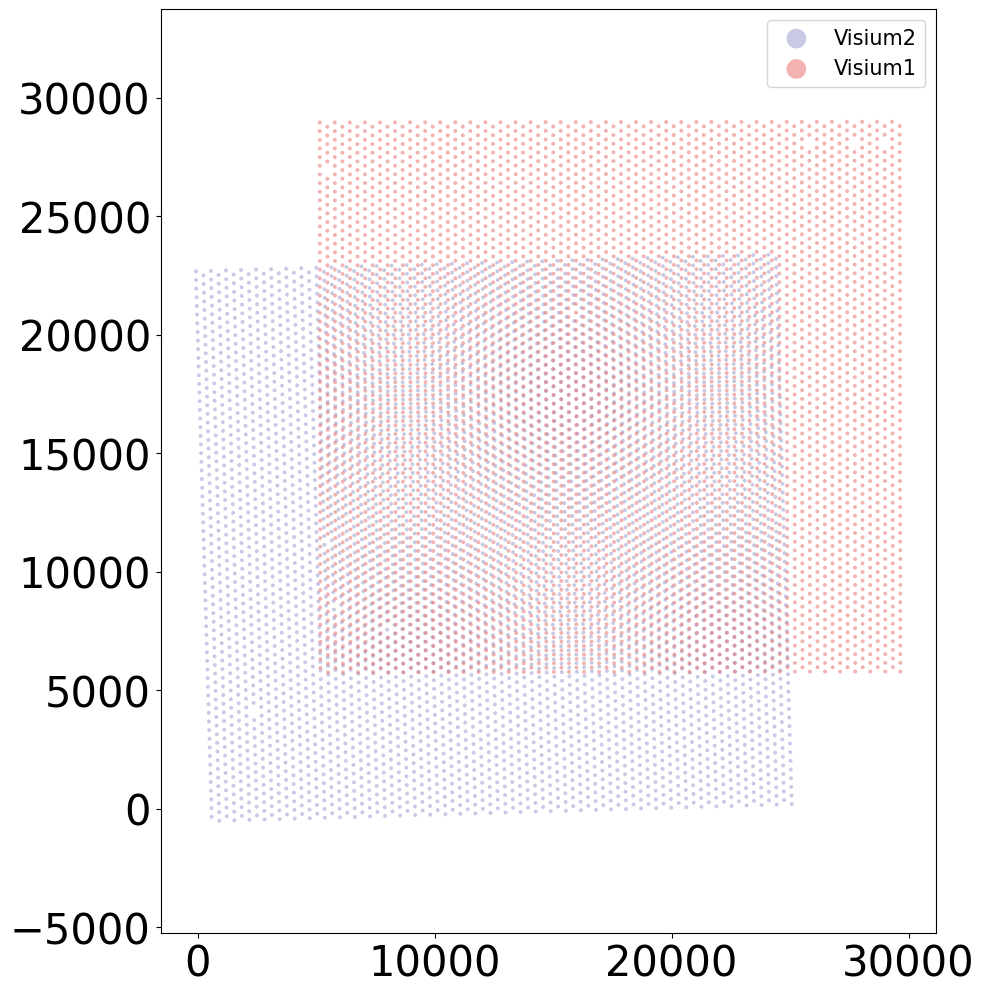

In [5]:
## Visualize the combined data (before CAST is applied)

coords_t = np.array(sdata.obs[['column', 'row']])
plot_mid(coords_t[sdata.obs[batch_key] == sample_list[0]],
         coords_t[sdata.obs[batch_key] == sample_list[1]],
         output_path=output_path,
         filename = 'Align_raw',
         title_t = [sample_list[1],
                    sample_list[0]],
         s_t = 8,scale_bar_t = None)

In [6]:
## Extract and subset the coordinate and expression data for each sample

coords_raw,exps = extract_coords_exp(sdata, batch_key = 'batch', cols = ['column', 'row'], count_layer = '.X', data_format = 'norm1e4')
torch.save(coords_raw, f'{output_path}/coords_raw.pt')

Preprocessing...


Constructing delaunay graphs for 2 samples...
Training on cuda:0...


Loss: -465.295 step time=0.053s: 100%|████████████████████████████████████████████████████████████| 400/400 [00:17<00:00, 22.86it/s]


Finished.
The embedding, log, model files were saved to /home/unix/panj/wanglab/jessica/CAST/demo/demo5_Visium/demo_output/Visium_vs_Visium
Perform KMeans clustering on 9975 cells...
Plotting the KMeans clustering results...


array([ 9, 15,  4, ...,  5,  8, 11], dtype=int32)

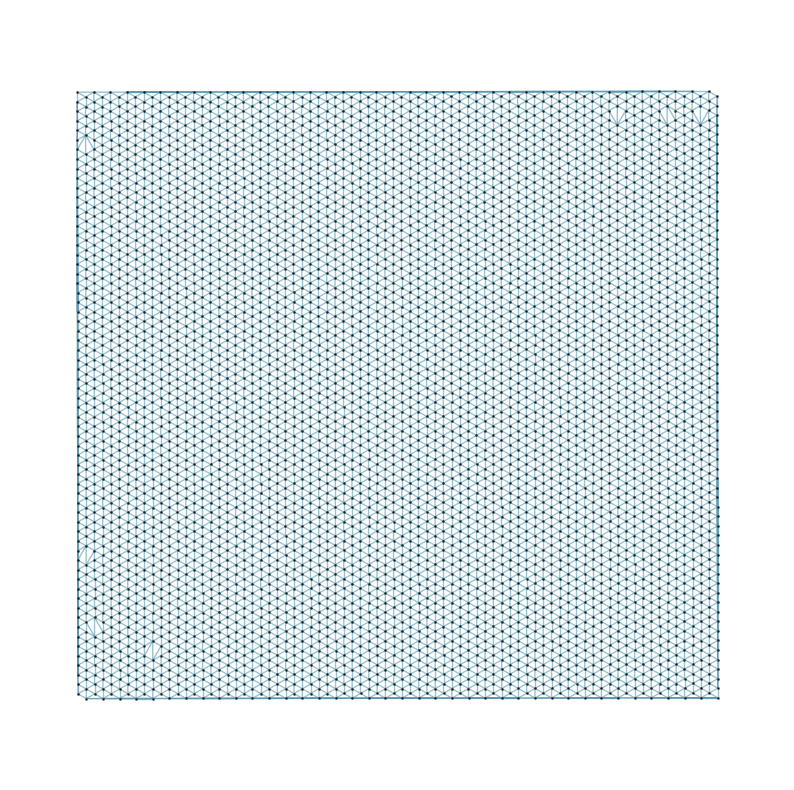

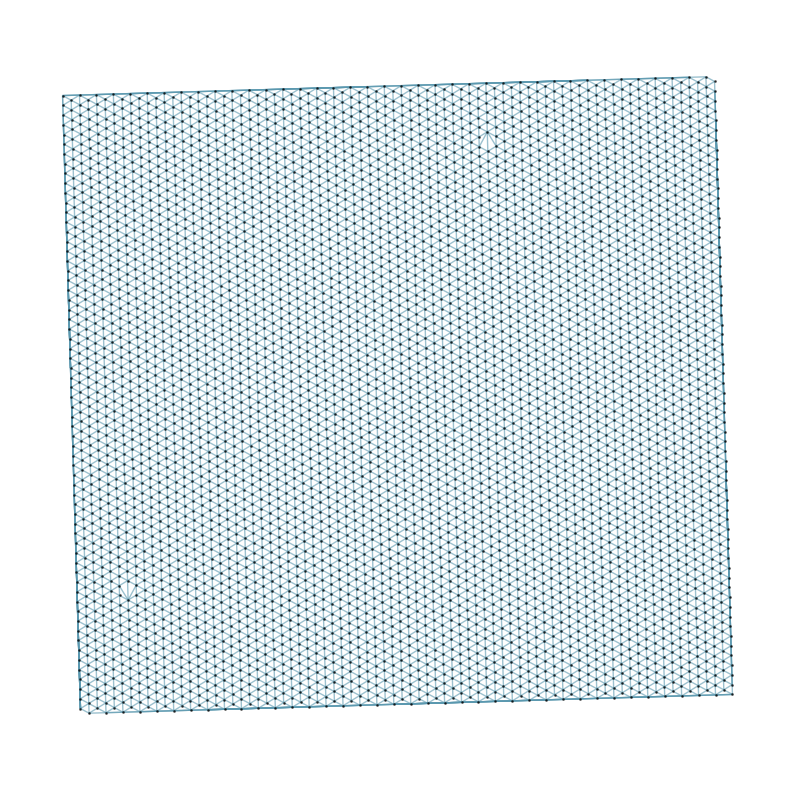

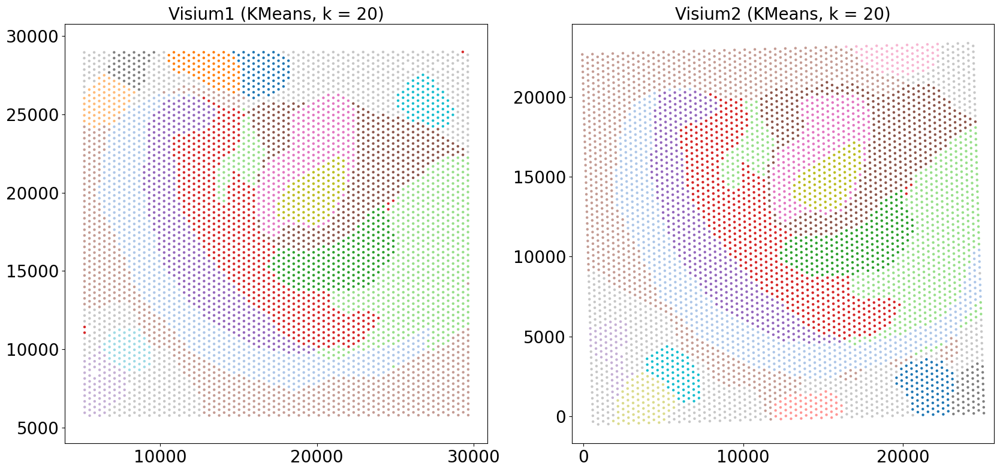

In [7]:
## Run CAST Mark — capture common spatial features

# set the parameters for CAST Mark
from CAST.models.model_GCNII import Args
args = Args(
    dataname='task1', # name of the dataset, used to save the log file
    gpu = 0, # gpu id, set to zero for single-GPU nodes
    epochs=400, # number of epochs for training
    lr1= 1e-3, # learning rate
    wd1= 0, # weight decay
    lambd= 1e-3, # lambda in the loss function, refer to online methods
    n_layers=2, # number of GCNII layers, more layers mean a deeper model, larger reception field, at a cost of VRAM usage and computation time
    der=0.5, # edge dropout rate in CCA-SSG
    dfr=0.3, # feature dropout rate in CCA-SSG
    use_encoder=True, # perform a single-layer dimension reduction before the GNNs, helps save VRAM and computation time if the gene panel is large
    encoder_dim=512, # encoder dimension, ignore if `use_encoder` set to `False`
)

# run CAST Mark
embed_dict = CAST_MARK(coords_raw,exps,output_path,args = args,graph_strategy='delaunay')

# plot the results
kmeans_plot_multiple(embed_dict,sample_list,coords_raw,'demo1',output_path,k=20,dot_size = 10,minibatch=True)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 62.87it/s]


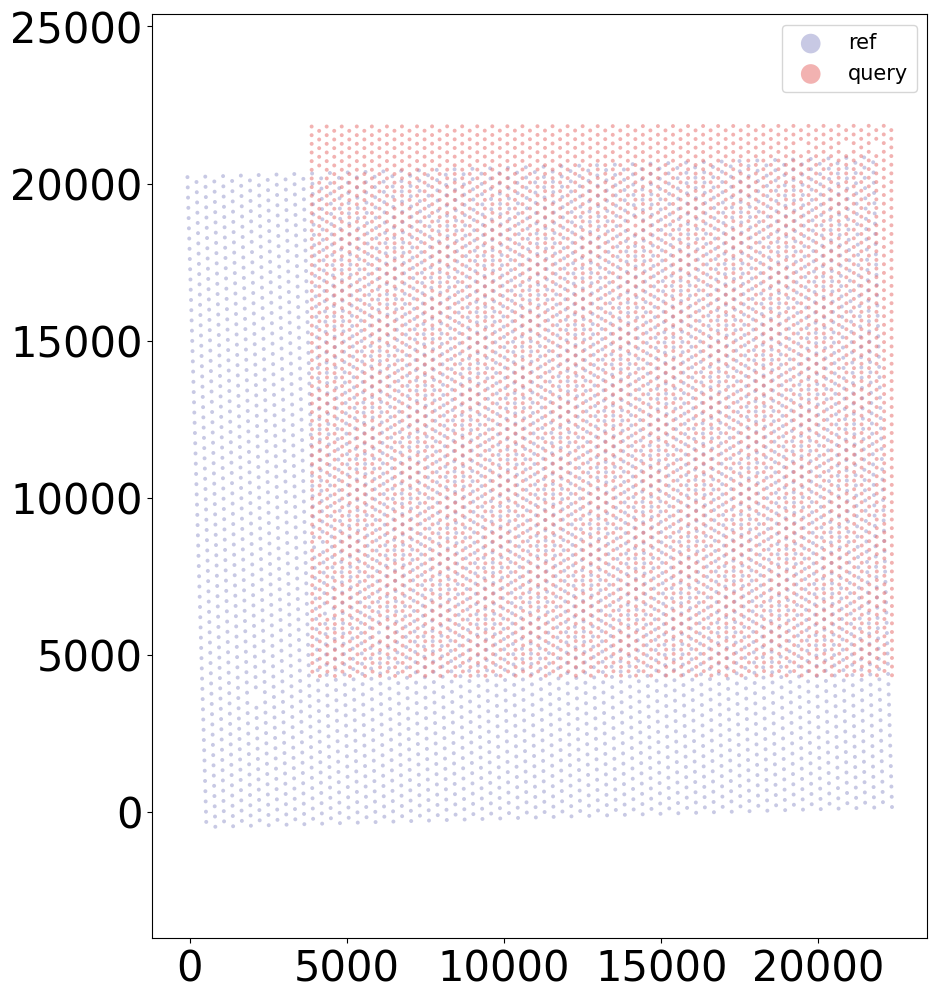

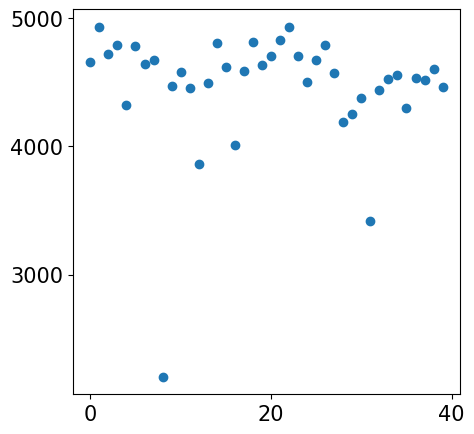

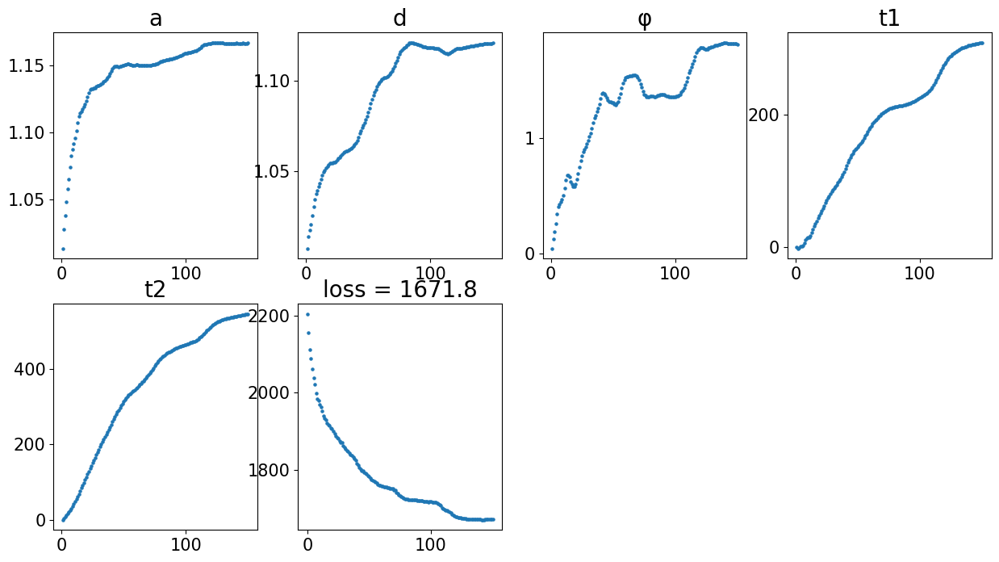

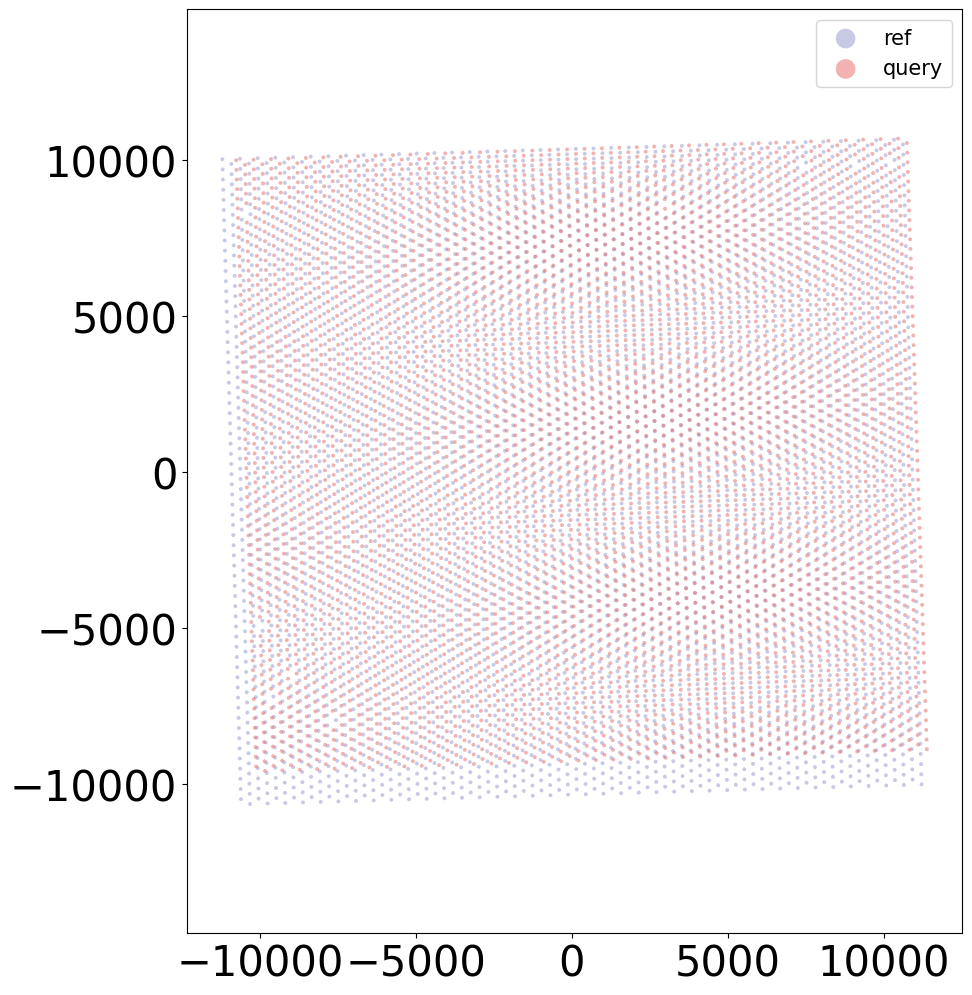

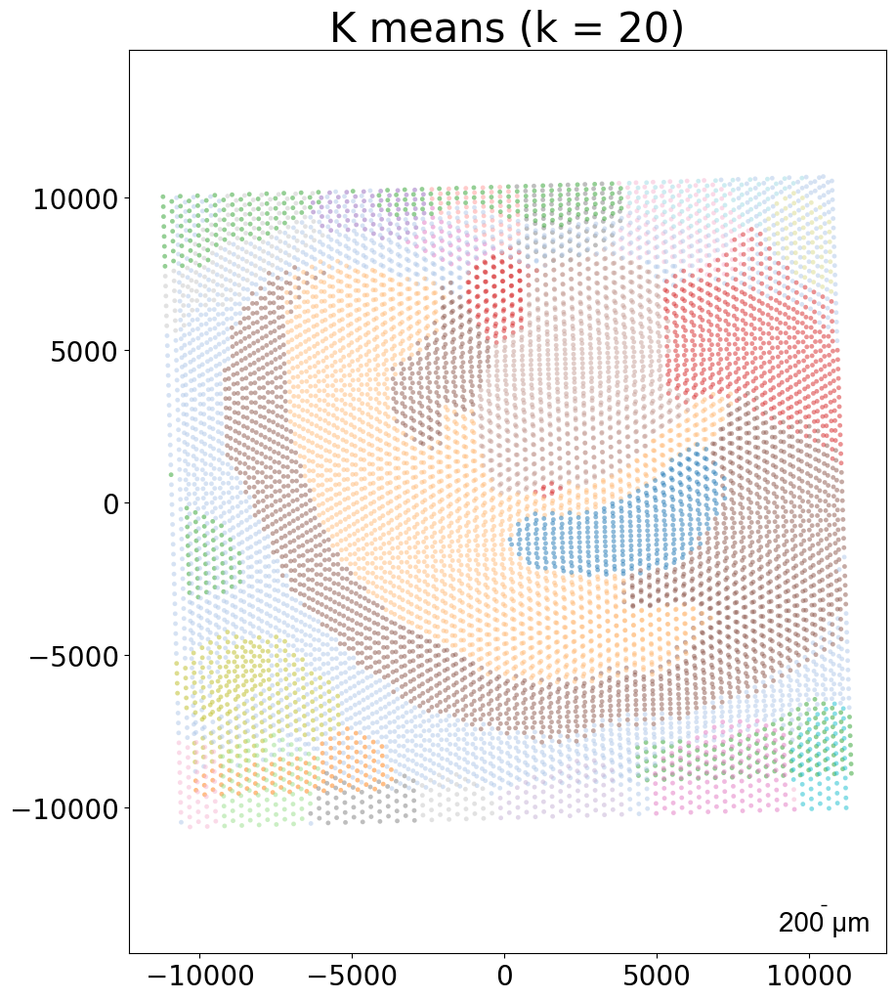

...

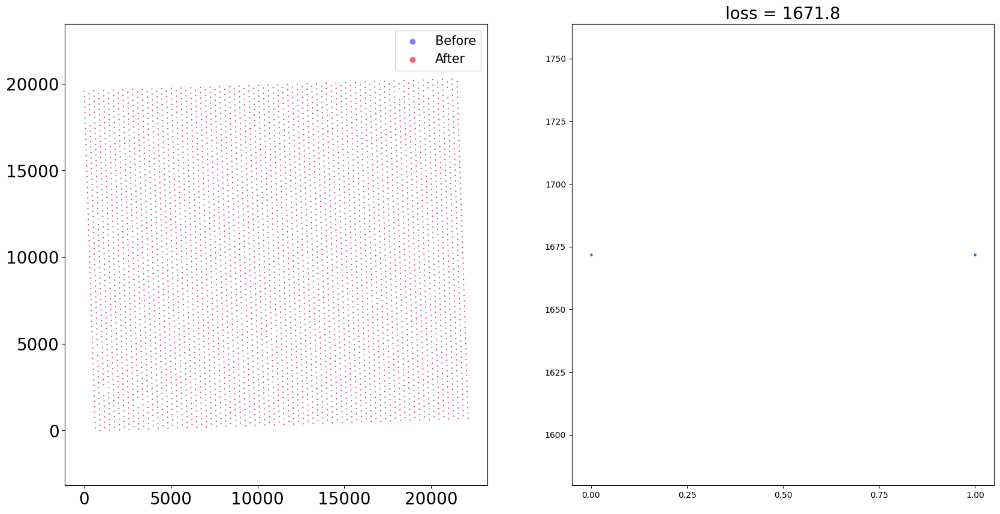

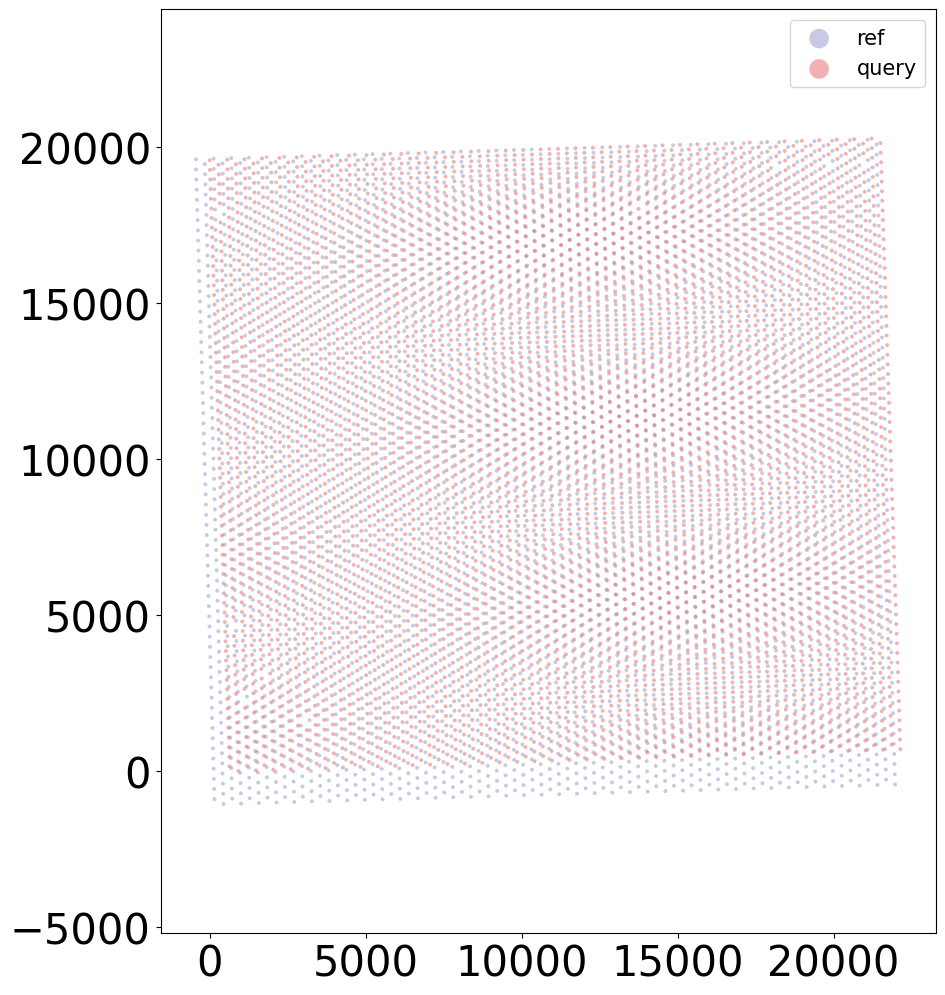

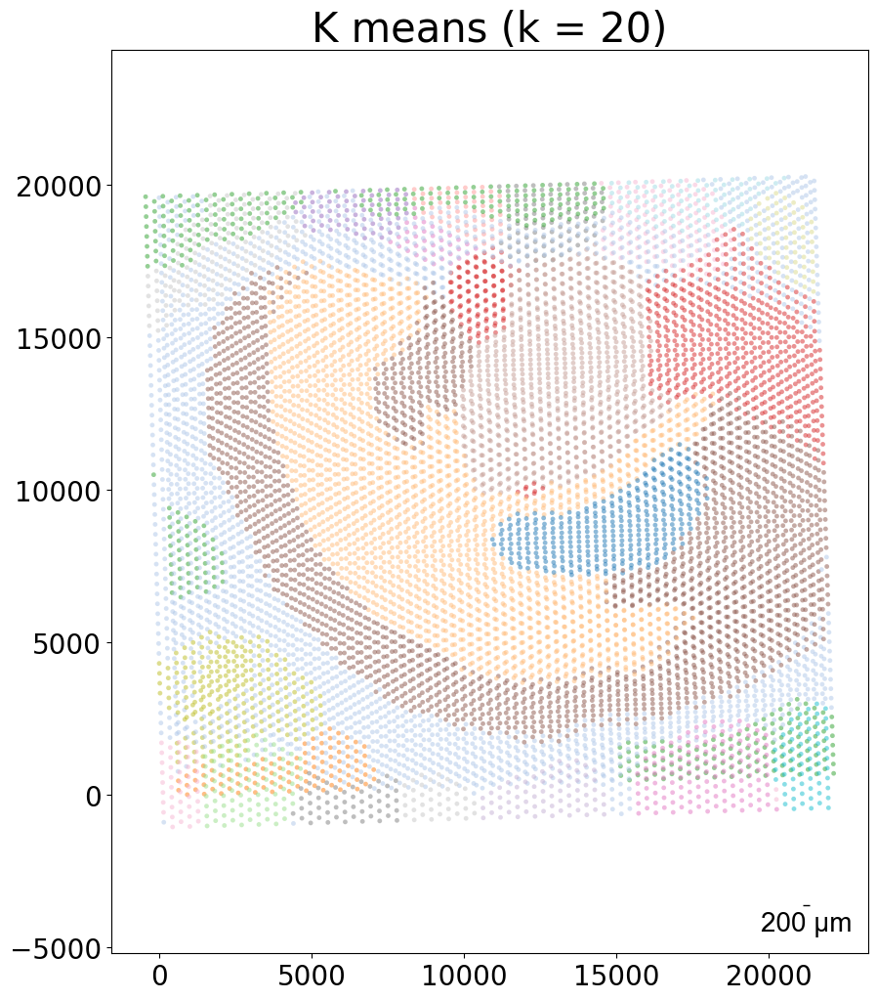

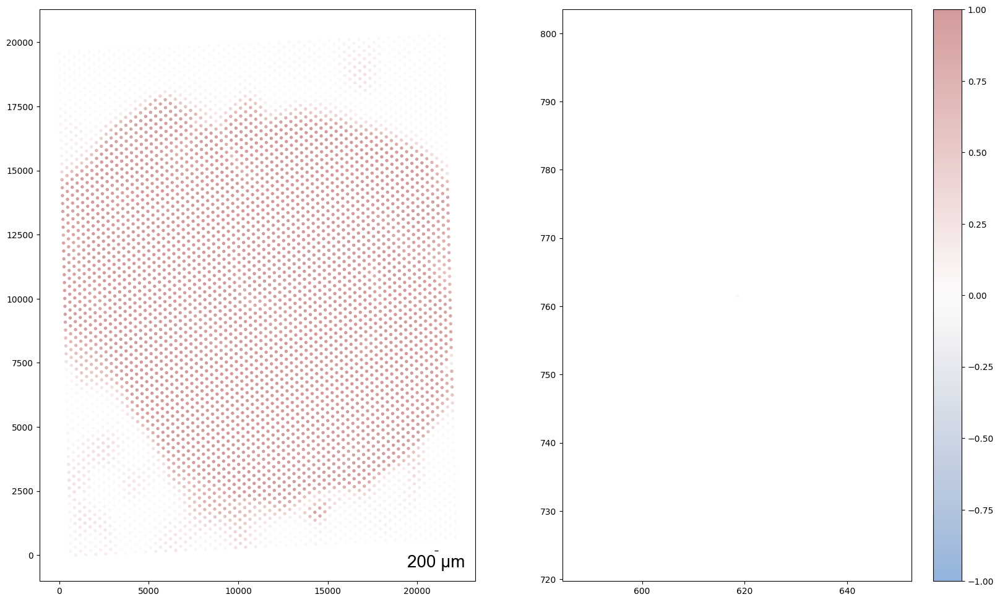

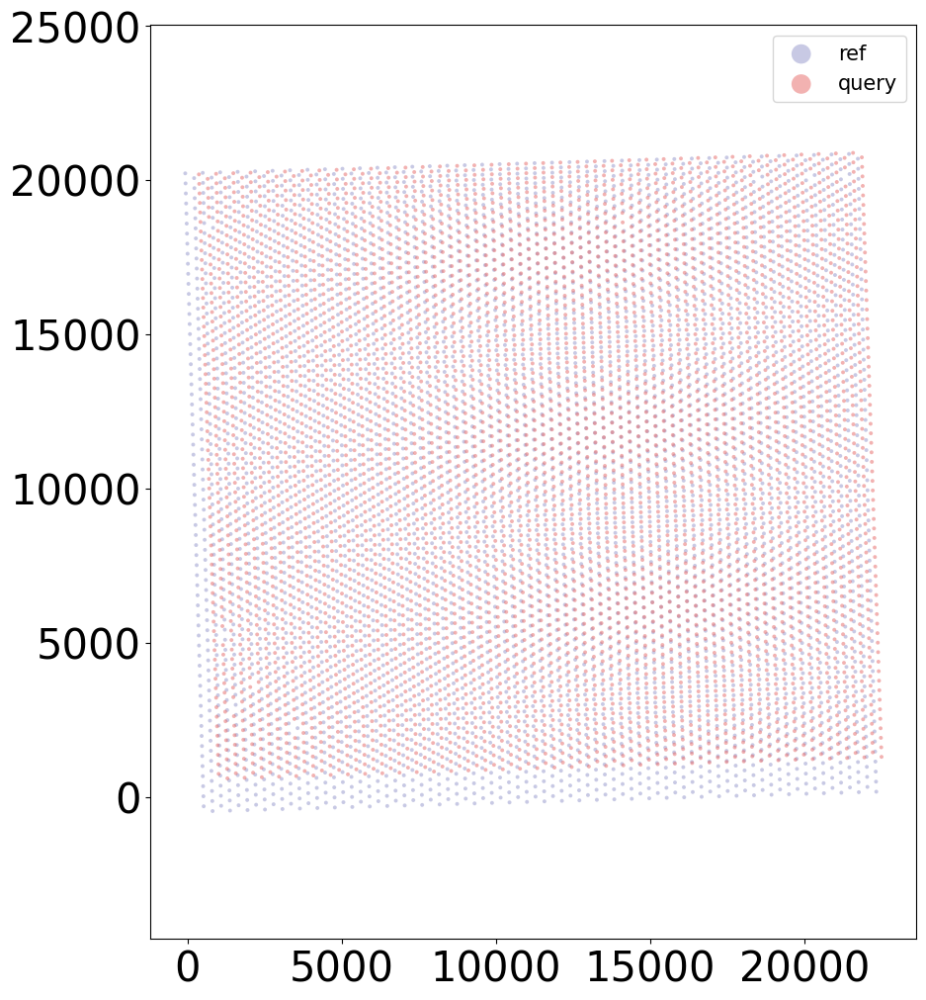

In [8]:
## Run CAST Stack — align the two samples

# normalize the coordinates in coords_raw2 (max value is 22340)
coords_raw2 = coords_raw.copy()
for sample_t in sample_list:
    coords_raw2[sample_t] = coords_raw2[sample_t] / coords_raw2[sample_t].max() * 22340

# set the parameters for CAST Stack
query_sample = sample_list[0]
params_dist = reg_params(dataname = query_sample,
                            gpu = 0 if torch.cuda.is_available() else -1, 
                            #### Affine parameters
                            iterations=150,
                            dist_penalty1=0,
                            bleeding=500,
                            d_list = [3,2,1,1/2,1/3],
                            attention_params = [None,3,1,0], 
                            #### FFD parameters    
                            dist_penalty2 = [0],
                            alpha_basis_bs = [0],
                            meshsize = [8],
                            iterations_bs = [1],
                            attention_params_bs = [[None,3,1,0]],
                            mesh_weight = [None])
# set the alpha basis for the affine transformation
params_dist.alpha_basis = torch.Tensor([1/1000,1/1000,1/50,5,5]).reshape(5,1).to(params_dist.device)

# run CAST Stack
coord_final = CAST_STACK(coords_raw2,embed_dict,output_path,sample_list,params_dist,sub_node_idxs = None)

Perform KMeans clustering on 9975 cells...
Plotting the KMeans clustering results...
Perform KMeans clustering on 9975 cells...
Plotting the KMeans clustering results...


array([ 9, 15,  4, ...,  5,  8, 11], dtype=int32)

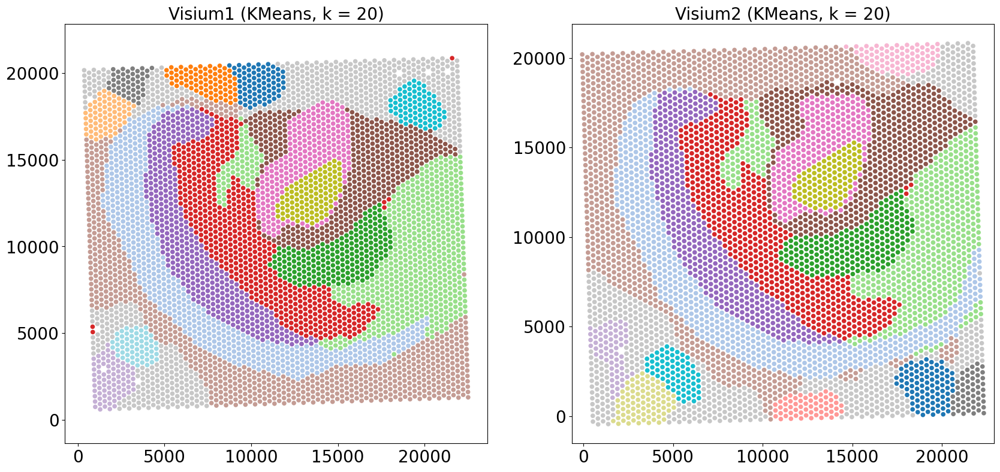

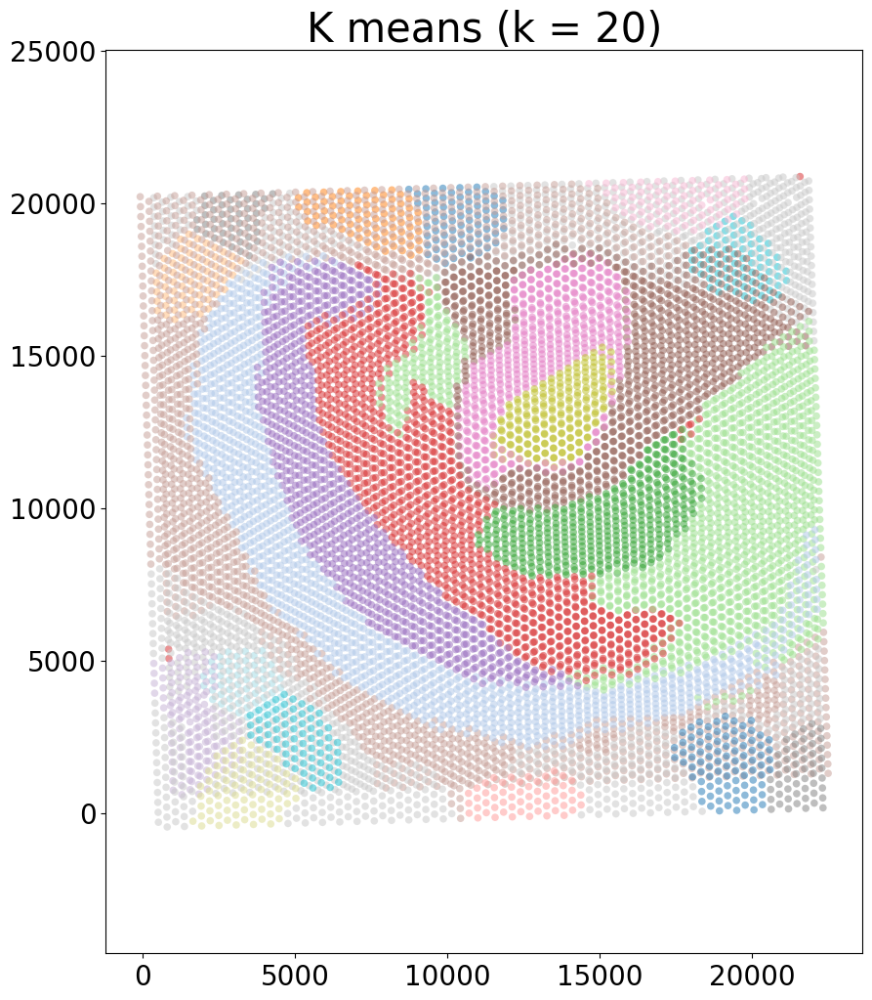

In [9]:
## Visualize the aligned data

# Side-by-side plots 
kmeans_plot_multiple(embed_dict,sample_list,coord_final,'demo1_new',output_path,k=20,dot_size = 30,minibatch=True)
# Overlay plot
kmeans_plot_multiple(embed_dict,sample_list,coord_final,'demo1_new',output_path,k=20,dot_size = 30,minibatch=True,plot_strategy='stack')